In [20]:
import os
import time
from glob import glob

import anndata
import joblib
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pynndescent
import seaborn as sns

mpl.style.use("default")
mpl.rcParams["pdf.fonttype"] = 42
mpl.rcParams["ps.fonttype"] = 42
mpl.rcParams["font.family"] = "sans-serif"
mpl.rcParams["font.sans-serif"] = "Helvetica"
from ALLCools.integration import confusion_matrix_clustering
from ALLCools.plot import *
from sklearn.preprocessing import OneHotEncoder, normalize
from statsmodels.sandbox.stats.multicomp import multipletests as FDR
from wmb import brain


In [13]:
region_to_subregion = {'CTX': ['MOp','SSp','ACA','AI','RSP','AUD','PTLp','VIS'],
                       'HIP': ['CAa','CAp','DGa','DGp'],
                       'RHP': ['ENT'],
                       'OLF': ['MOB', 'AON'],
                       'PIR': ['PIRa','PIRp'],
                       'STR': ['STR'],
                       'PAL': ['PAL'],
                       'AMY': ['AMY'],
                       'TH': ['THm','THl','THp'],
                       'HY': ['HY'],
                       'MB': ['SC','MRN','VTA','PAG','IC'],
                       'HB': ['P','MY']
                      }
rs1_subregion_dict = {
    "MOp": ["MOp-2", "MOp-3"],
    "SSp": ["SSp-3", "SSp-4"],
    "ACA": ["PFC-2", "ACA-1", "ACA-2"],
    "AI": ["AI"],
    "RSP": ["RSP-3", "RSP-4"],
    "AUD": ["AUD-1", "AUD-2"],
    "PTLp": ["PTLp"],
    "VIS": ["VIS-2", "VIS-3"],
    "ENT": ["RHP-1", "RHP-2", "RHP-3", "RHP-5"],
    "CAa": ["CA-i", "CA-ii"],
    "CAp": ["CA-iii", "CA-iv"],
    "DGa": ["DG-1", "DG-2"],
    "DGp": ["DG-3", "DG-4"],
    "PIRa": ["PIR-1", "PIR-2", "PIR-3", "PIR-4"],
    "PIRp": ["PIR-5", "PIR-6", "PIR-7", "PIR-8"],
    "MOB": ["MOB"],
    "AON": ["AON"],
    "PAL": ["PAL-1", "PAL-2", "PAL-3", "GP"],
    "STR": ["CP-1", "CP-2", "CP-3"],
    "AMY": ["AMY-1", "AMY-2", "AMY-3"],
    "THl": ["TH-1", "TH-3"],
    "THm": ["TH-2", "TH-4"],
    "THp": ["TH-5", "TH-6", "TH-7"],
    "HY": ["HY-1", "HY-2", "HY-3", "HY-4"],
    "SC": ["SC-1", "SC-2", "SC-3"],
    "MRN": ["PAG-3", "PAG-4", "MRN"],
    "VTA": ["VTA-1", "VTA-2"],
    "PAG": ["PAG-1", "PAG-2"],
    "IC": ["IC-1"],
    "P": ["PRN-1", "PRN-2", "PRN-3", "PRN-4", "PCG"],
    "MY": ["MY-1", "MY-2", "MY-3", "MY-4"],
}

rs2_subregion_dict = {
    "MOp": ["3C", "4B"],
    "SSp": ["6B", "7B"],
    "ACA": ["3A", "4A", "5A"],
    "AI": ["3D"],
    "RSP": ["9A", "10A"],
    "AUD": ["9D", "10C"],
    "PTLp": ["9B"],
    "VIS": ["11B", "12B"],
    "ENT": ["10D11D12D13B"],
    "CAa": ["8E9H"],
    "CAp": ["10E11E"],
    "DGa": ["8J9J"],
    "DGp": ["10F11F"],
    "PIRa": ["2D3E4F5G"],
    "PIRp": ["6D7D8D9E"],
    "MOB": ["1C"],
    "AON": ["2E"],
    "PAL": ["4H5H6F7F", "6F7F"],
    "STR": ["4D5E6E"],
    "AMY": ["7H8H9G"],
    "THl": ["7E8F"],
    "THm": ["7G8G"],
    "THp": ["9K10G"],
    "HY": ["6H7J8K9L"],
    "SC": ["11G12F13C"],
    "MRN": ["10H11H12H"],
    "VTA": ["10J11J"],
    "PAG": ["12G13D"],
    "IC": ["14A"],
    "P": ["12J13E13F14C14D"],
    "MY": ["15C16C17B18B"],
}

In [3]:
rs1map = {xx: yy for yy in rs1_subregion_dict for xx in rs1_subregion_dict[yy]}
rs2map = {xx: yy for yy in rs2_subregion_dict for xx in rs2_subregion_dict[yy]}

In [ ]:
group_name = 'HB'

In [4]:
reg = group_name

In [5]:
adata = anndata.read_h5ad(
    glob(f"/rs2/221122-cemba-tenx-integration/{reg}/{reg}_*_rs1rs2rna.h5ad")[0]
)
adata

AnnData object with n_obs × n_vars = 92788 × 1
    obs: 'mCCCFrac', 'mCGFrac', 'mCHFrac', 'FinalmCReads', 'DissectionRegion', 'Plate', 'Col384', 'Row384', 'Slice', 'Sample', 'Technology', 'InputReads', 'PassBasicQC', 'PlateNormCov', 'CEMBARegion', 'MajorRegion', 'SubRegion', 'L1', 'L1_annot', 'L4', 'L4Region', 'L2_annot', 'Train', 'Study', 'Exp', 'Source', 'Target', 'Gender', 'L2', 'L3', 'PlateNormReads', 'count', 'umi_count', 'tsne_0', 'tsne_1', 'leiden'
    uns: 'leiden', 'neighbors'
    obsm: 'X_pca', 'X_tsne', 'u50seurat_tsne'
    obsp: 'connectivities', 'distances'

In [6]:
adata.obs["Source"] = adata.obs["Source"].astype(str)
adata.obs.loc[adata.obs["Study"] == "CEMBA_snmC", "Source"] = adata.obs.loc[
    adata.obs["Study"] == "CEMBA_snmC", "DissectionRegion"
].map(rs1map)
adata.obs.loc[adata.obs["Study"] == "CEMBA_EpiRetro", "Source"] = adata.obs.loc[
    adata.obs["Study"] == "CEMBA_EpiRetro", "Slice"
].map(rs2map)
adata.obs["Source"].value_counts()

nan    67701
P      13621
MY     11466
Name: Source, dtype: int64

In [7]:
coord_base = "tsne"
ds = 0.5

In [8]:
meta = pd.read_hdf(
    "/cemba/MERFISH/MERFISH.TotalWatershedMetadata.Rotation.BasicFilter.hdf"
)
meta

,fov,volume,center_x,center_y,min_x,max_x,min_y,max_y,experiment,region,slice,replicate,sample,n_counts,n_genes,blank_count,standard_center_x,standard_center_y
cell,,,,,,,,,,,,,,,,,,
Sagittal-R1-1043754162511822305451378439343902674,0,180.816803,216.255966,2339.391113,212.853958,219.657959,2334.855225,2343.927246,202205231554_MouseSagittalM3S1_VMSC01101,region_0,Sagittal,R1,Sagittal-R1,78,59,0,12481.011719,626.663635
Sagittal-R1-115889605987730877346658197744887916157,0,661.598145,225.273956,2364.339111,220.413956,230.133957,2358.615234,2370.063232,202205231554_MouseSagittalM3S1_VMSC01101,region_0,Sagittal,R1,Sagittal-R1,288,95,1,12456.994141,615.399414
Sagittal-R1-118999854507870250420648053432664395722,0,336.684296,129.693954,2417.313232,124.617958,134.769958,2413.155273,2421.471191,202205231554_MouseSagittalM3S1_VMSC01101,region_0,Sagittal,R1,Sagittal-R1,106,59,0,12487.121094,510.355774
Sagittal-R1-124436133021557870166867524905466212748,0,304.041138,306.381958,2501.283203,301.413971,311.349976,2497.395264,2505.171143,202205231554_MouseSagittalM3S1_VMSC01101,region_0,Sagittal,R1,Sagittal-R1,128,66,2,12302.807617,575.917297
Sagittal-R1-131672228322041345871158129298266933775,0,460.206055,182.559967,2519.265137,175.701965,189.417953,2509.815186,2528.715088,202205231554_MouseSagittalM3S1_VMSC01101,region_0,Sagittal,R1,Sagittal-R1,182,79,0,12377.648438,475.646820
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
C5-R2-271793678466067384875604809317522593698,783,770.204590,6430.370605,2152.776855,6420.650391,6440.090332,2145.000977,2160.552979,202212221150_MouseHanqingC22_VMSC01101,region_1,C5,R2,C5-R2,402,170,2,5201.628418,6237.214355
C5-R2-331405986725874287089321241808686828691,783,720.389099,6354.338379,2153.155029,6348.398438,6360.278320,2147.160889,2159.148926,202212221150_MouseHanqingC22_VMSC01101,region_1,C5,R2,C5-R2,462,201,3,5143.627441,6188.051758
C5-R2-336153604579692482483469578922665163928,783,803.691895,6420.542480,2207.155029,6415.034668,6426.050293,2200.620850,2213.688965,202212221150_MouseHanqingC22_VMSC01101,region_1,C5,R2,C5-R2,348,169,3,5229.053223,6189.240723


In [9]:
meta_rs2 = pd.read_csv("/cemba/CEMBA_RS2/cell_48032_RS2_meta_nooutlier.csv.gz", index_col=0, header=0)
meta_rs2 = meta_rs2.loc[meta_rs2['PassTargetFilter']]


In [10]:
batch_list = [
    f"{xx}-{yy}"
    for xx in ["Sagittal", "C1", "C3", "C5", "C7", "C9", "C11", "C13"]
    for yy in ["R1", "R2"]
]
batch_list

['Sagittal-R1',
 'Sagittal-R2',
 'C1-R1',
 'C1-R2',
 'C3-R1',
 'C3-R2',
 'C5-R1',
 'C5-R2',
 'C7-R1',
 'C7-R2',
 'C9-R1',
 'C9-R2',
 'C11-R1',
 'C11-R2',
 'C13-R1',
 'C13-R2']

In [11]:
result = pd.read_hdf("MERFISH_cocluster.hdf", key="data")
result[["sample", "spatial_0", "spatial_1"]] = meta[
    ["sample", "standard_center_x", "standard_center_y"]
]
print(result["score"].min())

0.15427673002704978


In [12]:
(result["score"] < 0.6).sum() / result.shape[0]

0.1812987012987013

findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica


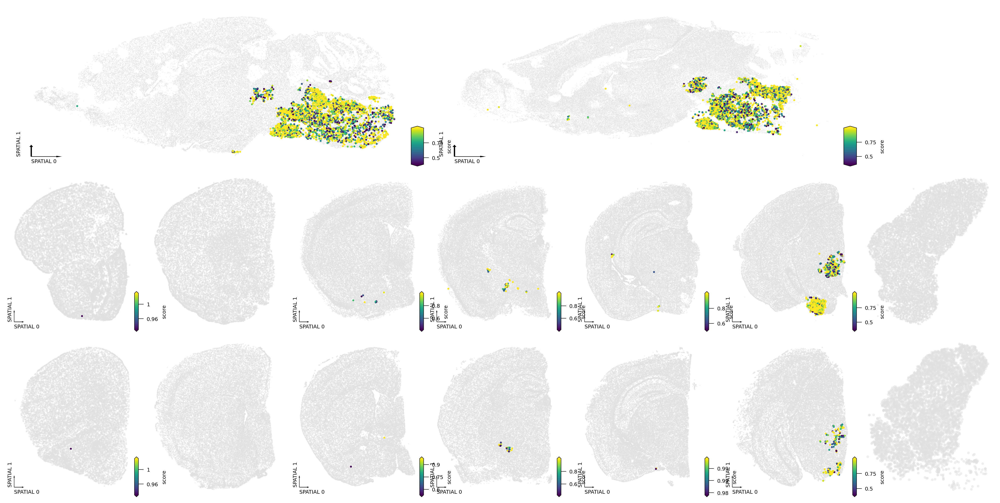

In [13]:
fig, axes = plt.subplots(3, 7, figsize=(16, 8), dpi=300, constrained_layout=True)
gs = axes[0, 0].get_gridspec()
for ax in axes[0]:
    ax.remove()

axs1 = fig.add_subplot(gs[0, :3])
axs2 = fig.add_subplot(gs[0, 3:6])

axes = np.concatenate([[axs1, axs2], axes[1:].flatten("F")])
for i, xx in enumerate(batch_list):
    ax = axes[i]
    ax.axis("off")
    tmp = meta[meta["sample"] == xx]
    ax.scatter(
        tmp["standard_center_x"],
        tmp["standard_center_y"],
        c="#e0e0e0",
        edgecolors="none",
        s=50000 / tmp.shape[0],
        alpha=0.5,
        rasterized=True,
    )
    tmp = result[result["sample"] == xx]
    if tmp.shape[0] > 0:
        _ = continuous_scatter(
            data=tmp,
            ax=ax,
            coord_base="spatial",
            s=min(5, [10000, 50000][int(i < 2)] / tmp.shape[0]),
            hue="score",
            # text_anno='MajorRegion',
            cmap="viridis",
            labelsize=6,
            max_points=None,
            scatter_kws={"rasterized": True},
            # show_legend=True,
            # legend_kws={'ncol':1, 'fontsize':4},
        )

In [14]:
result = result[result["score"] >= 0.6]

In [15]:
count_rs1 = adata.obs.loc[adata.obs['Study']=='CEMBA_snmC', ['Source', 'leiden']].astype(str).value_counts().unstack(fill_value=0)
count_rs1 = (count_rs1>10) & (count_rs1/count_rs1.sum(axis=0)>0.1)
count_rs1

leiden,0,1,10,100,101,102,103,104,105,106,...,90,91,92,93,94,95,96,97,98,99
Source,,,,,,,,,,,,,,,,,,,,,
MY,False,True,True,False,True,True,False,True,True,True,...,False,True,True,True,True,False,False,True,True,True
P,True,True,True,True,True,False,True,True,False,False,...,True,False,False,True,False,True,False,True,False,True


In [1]:
indir = "/home/jzhou_salk_edu/sky_workdir/230216_projection_enrichment/"
outdir = '/home/jzhou_salk_edu/sky_workdir/230224_merfish_integration/'
os.makedirs(f'{outdir}plot/{reg}/', exist_ok=True)


In [18]:
for t in region_to_subregion[reg]:
    bkg = reg + '-' + count_rs1.columns[count_rs1.loc[t]]
    data = pd.read_csv(
        f"{indir}lmm_rs1norep/result/{t}_stats.csv", index_col=None, header=0
    )
    data["fdr"] = FDR(data["pvalue"], 0.01, "fdr_bh")[1]
    data["leiden"] = data["leiden"].astype(str)
    fc = data.set_index(["Target", "leiden"])["slope"].unstack(fill_value=0)
    fdr = data.set_index(["Target", "leiden"])["fdr"].unstack(fill_value=1)
    fdr_e = pd.read_hdf(f"{indir}fisher/result/{t}_enrichstats.hdf", key="data")
    fc_e = pd.read_hdf(f"{indir}fisher/result/{t}_fc.hdf", key="data")
    for tmp in [fdr_e, fc_e]:
        tmp.columns = tmp.columns.str.split(":").str[0]
        tmp["Target"] = tmp.index.str.split(">").str[1]
    fdr_e = fdr_e.groupby("Target").min()
    fc_e = fc_e.groupby("Target").min()
    
    sig = (fdr<0.01) & (fc>0) & (fdr_e<0.01) & (fc_e>2)
    sig = sig.loc[:, sig.sum(axis=0)>0]
    idx = ['/'.join(sig.index[sig[xx]]) for xx in sig.columns]
    idx = pd.Series(idx, index=reg + "-" + sig.columns)
    leg = idx.index
    palette = {xx: yy for xx, yy in zip(idx.unique(), sns.color_palette("tab20", len(leg)))}
    
    fig, axes = plt.subplots(3, 7, figsize=(16, 8), dpi=300, constrained_layout=True)
    fig.suptitle(f'{t} enrich', fontsize=16)
    gs = axes[0, 0].get_gridspec()
    for ax in axes[0, :-1]:
        ax.remove()

    axs1 = fig.add_subplot(gs[0, :3])
    axs2 = fig.add_subplot(gs[0, 3:6])

    axes = np.concatenate([[axs1, axs2], axes[1:].flatten("F"), [axes[0, -1]]])

    markers = [
        plt.Line2D([0, 0], [0, 0], color=color, marker="o", linestyle="")
        for color in palette.values()
    ]

    ax = axes[-1]
    ax.axis("off")
    ax.legend(
        markers,
        palette.keys(),
        numpoints=1,
        ncol=1,
        markerscale=0.5,
        fontsize=5,
        bbox_to_anchor=(0, 1),
        loc="upper left",
    )

    for i, xx in enumerate(batch_list):
        ax = axes[i]
        ax.axis("off")
        tmp = meta[meta["sample"] == xx]
        ax.scatter(
            tmp["standard_center_x"],
            tmp["standard_center_y"],
            c="#e0e0e0",
            edgecolors="none",
            s=0.5,
            alpha=0.5,
            rasterized=True,
        )
        _ = categorical_scatter(
            data=result.loc[result["cocluster"].isin(bkg) & (result["sample"] == xx)],
            ax=ax,
            coord_base="spatial",
            s=2,
            color="#d0d0d0",
            labelsize=6,
            max_points=None,
            # outline='cocluster',
            scatter_kws={"rasterized": True},
            # show_legend=(xx=='Sagittal-R2'),
            # legend_kws={'ncol':2, 'fontsize':10},
        )
        tmp0 = result.loc[result["cocluster"].isin(leg) & (result["sample"] == xx)]
        tmp0['group'] = tmp0['cocluster'].map(idx)
        if tmp0.shape[0] > 0:
            _ = categorical_scatter(
                data=tmp0,
                ax=ax,
                coord_base="spatial",
                s=min(5, [50000, 100000][int(i < 2)] / tmp.shape[0]),
                hue="group",
                # text_anno='MajorRegion',
                palette=palette,
                labelsize=6,
                max_points=None,
                scatter_kws={"rasterized": True},
                # show_legend=(xx=='Sagittal-R2'),
                # legend_kws={'ncol':2, 'fontsize':10},
            )

    plt.savefig(f'{outdir}plot/{reg}/{t}.targetenrichcluster.pdf', transparent=True)
    plt.close()
    
    count = adata.obs.loc[(adata.obs['Source']==t) & adata.obs.index.isin(meta_rs2.index), ['Target', 'leiden']].astype(str).value_counts().unstack(fill_value=0)
    ratio = (count / count.sum(axis=1)[:, None]) > 0.1
    ratio = ratio.loc[:, (ratio.sum(axis=0)>0) & ((count>5).sum(axis=0)>0)]
    idx = ['/'.join(ratio.index[ratio[xx]]) for xx in ratio.columns]
    idx = pd.Series(idx, index=reg + "-" + ratio.columns)
    leg = idx.index
    palette = {xx: yy for xx, yy in zip(idx.unique(), sns.color_palette("tab20", len(leg)))}
    print(t, sig.shape, ratio.shape, len(palette))
    
    fig, axes = plt.subplots(3, 7, figsize=(16, 8), dpi=300, constrained_layout=True)
    fig.suptitle(f'{t} proportion', fontsize=16)
    gs = axes[0, 0].get_gridspec()
    for ax in axes[0, :-1]:
        ax.remove()

    axs1 = fig.add_subplot(gs[0, :3])
    axs2 = fig.add_subplot(gs[0, 3:6])

    axes = np.concatenate([[axs1, axs2], axes[1:].flatten("F"), [axes[0, -1]]])

    markers = [
        plt.Line2D([0, 0], [0, 0], color=color, marker="o", linestyle="")
        for color in palette.values()
    ]

    ax = axes[-1]
    ax.axis("off")
    ax.legend(
        markers,
        palette.keys(),
        numpoints=1,
        markerscale=0.5,
        fontsize=5,
        ncol=1,
        bbox_to_anchor=(0, 1),
        loc="upper left",
    )

    for i, xx in enumerate(batch_list):
        ax = axes[i]
        ax.axis("off")
        tmp = meta[meta["sample"] == xx]
        ax.scatter(
            tmp["standard_center_x"],
            tmp["standard_center_y"],
            c="#e0e0e0",
            edgecolors="none",
            s=0.5,
            alpha=0.5,
            rasterized=True,
        )
        _ = categorical_scatter(
            data=result.loc[result["cocluster"].isin(bkg) & (result["sample"] == xx)],
            ax=ax,
            coord_base="spatial",
            s=2,
            color="#d0d0d0",
            labelsize=6,
            max_points=None,
            # outline='cocluster',
            scatter_kws={"rasterized": True},
            # show_legend=(xx=='Sagittal-R2'),
            # legend_kws={'ncol':2, 'fontsize':10},
        )
        tmp0 = result.loc[result["cocluster"].isin(leg) & (result["sample"] == xx)]
        tmp0['group'] = tmp0['cocluster'].map(idx)
        if tmp0.shape[0] > 0:
            _ = categorical_scatter(
                data=tmp0,
                ax=ax,
                coord_base="spatial",
                s=min(5, [50000, 100000][int(i < 2)] / tmp.shape[0]),
                hue="group",
                # text_anno='MajorRegion',
                palette=palette,
                labelsize=6,
                max_points=None,
                scatter_kws={"rasterized": True},
                # show_legend=(xx=='Sagittal-R2'),
                # legend_kws={'ncol':2, 'fontsize':10},
            )
    plt.savefig(f'{outdir}plot/{reg}/{t}.targetabundcluster.pdf', transparent=True)
    plt.close()
    

P (6, 13) (6, 7) 6
MY (5, 13) (5, 5) 4


In [19]:
for t in region_to_subregion[reg]:
    data = pd.read_csv(
        f"{indir}lmm_rs1norep/result/{t}_stats.csv", index_col=None, header=0
    )
    data["fdr"] = FDR(data["pvalue"], 0.01, "fdr_bh")[1]
    data["leiden"] = data["leiden"].astype(str)
    fc = data.set_index(["Target", "leiden"])["slope"].unstack(fill_value=0)
    fdr = data.set_index(["Target", "leiden"])["fdr"].unstack(fill_value=1)
    fdr_e = pd.read_hdf(f"{indir}fisher/result/{t}_enrichstats.hdf", key="data")
    fc_e = pd.read_hdf(f"{indir}fisher/result/{t}_fc.hdf", key="data")
    for tmp in [fdr_e, fc_e]:
        tmp.columns = tmp.columns.str.split(":").str[0]
        tmp["Target"] = tmp.index.str.split(">").str[1]
    fdr_e = fdr_e.groupby("Target").min()
    fc_e = fc_e.groupby("Target").min()
    tar_list = fdr_e.index & fdr.index
    for tar in tar_list:
        print(t, tar)
        leg = (
            fdr.columns[(fdr.loc[tar] < 0.01) & (fc.loc[tar] > 0)]
            & fdr_e.columns[fdr_e.loc[tar] < 0.01]
            & fc_e.columns[fc_e.loc[tar] > 2]
        )
        fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=300, constrained_layout=True)
        fig.suptitle(f'{t}>{tar}', fontsize=16)
        tmp = adata.obs.loc[adata.obs["leiden"].isin(leg)]
        ax = axes[0]
        ax.scatter(
            adata.obs[f"{coord_base}_0"],
            adata.obs[f"{coord_base}_1"],
            c="#e0e0e0",
            edgecolors="none",
            s=ds,
            rasterized=True,
        )
        _ = categorical_scatter(
            data=tmp,
            ax=ax,
            coord_base=coord_base,
            s=ds,
            hue="leiden",
            text_anno="leiden",
            palette="tab20",
            labelsize=10,
            max_points=None,
            scatter_kws={"rasterized": True},
            # show_legend=True,
            # legend_kws={'ncol':1},
        )

        ax = axes[1]
        tmp = adata.obs.loc[(adata.obs["Target"] == tar) & (adata.obs["Source"] == t)]
        ax.scatter(
            adata.obs[f"{coord_base}_0"],
            adata.obs[f"{coord_base}_1"],
            c="#e0e0e0",
            edgecolors="none",
            s=ds,
            rasterized=True,
        )
        _ = categorical_scatter(
            data=tmp,
            ax=ax,
            coord_base=coord_base,
            s=ds*5,
            hue="Gender",
            # text_anno='leiden',
            palette="tab10",
            labelsize=10,
            max_points=None,
            scatter_kws={"rasterized": True},
            show_legend=True,
            legend_kws={"ncol": 1},
        )
        plt.savefig(f'{outdir}plot/{reg}/{t}-{tar}.tsne.pdf', transparent=True)
        plt.close()

        leg = reg + "-" + leg
        palette = {xx: yy for xx, yy in zip(leg, sns.color_palette("tab10", len(leg)))}

        fig, axes = plt.subplots(3, 7, figsize=(16, 8), dpi=300, constrained_layout=True)
        gs = axes[0, 0].get_gridspec()
        for ax in axes[0, :-1]:
            ax.remove()

        axs1 = fig.add_subplot(gs[0, :3])
        axs2 = fig.add_subplot(gs[0, 3:6])

        axes = np.concatenate([[axs1, axs2], axes[1:].flatten("F"), [axes[0, -1]]])

        markers = [
            plt.Line2D([0, 0], [0, 0], color=color, marker="o", linestyle="")
            for color in palette.values()
        ]

        ax = axes[-1]
        ax.axis("off")
        ax.legend(
            markers,
            palette.keys(),
            numpoints=1,
            ncol=1,
            bbox_to_anchor=(0, 1),
            loc="upper left",
        )

        for i, xx in enumerate(batch_list):
            ax = axes[i]
            ax.axis("off")
            tmp = meta[meta["sample"] == xx]
            ax.scatter(
                tmp["standard_center_x"],
                tmp["standard_center_y"],
                c="#e0e0e0",
                edgecolors="none",
                s=50000 / tmp.shape[0],
                alpha=0.5,
                rasterized=True,
            )
            tmp0 = result.loc[result["cocluster"].isin(leg) & (result["sample"] == xx)]
            if tmp0.shape[0] > 0:
                _ = categorical_scatter(
                    data=tmp0,
                    ax=ax,
                    coord_base="spatial",
                    s=min(5, [50000, 100000][int(i < 2)] / tmp.shape[0]),
                    hue="cocluster",
                    # text_anno='MajorRegion',
                    palette=palette,
                    labelsize=6,
                    max_points=None,
                    scatter_kws={"rasterized": True},
                    # show_legend=(xx=='Sagittal-R2'),
                    # legend_kws={'ncol':2, 'fontsize':10},
                )
        plt.savefig(f'{outdir}plot/{reg}/{t}-{tar}.merfish.pdf', transparent=True)
        plt.close()
        

findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica


P CBN
P CBX
P HY
P MY
P SC
P TH
MY CBN
MY CBX
MY HY
MY SC
MY TH
